In [1]:
import oceanspy as ospy
import xarray as xr
import matplotlib.pyplot as plt
import cmocean.cm as cmo
import numpy as np
import scipy as sp

In [2]:
S = xr.open_dataset('D:/MScData/Horizontal_S.nc')['S']
T = xr.open_dataset('D:/MScData/Horizontal_Temp.nc')['Temp']
hor_vel = xr.open_dataset('D:/MScData/Horizontal_hor_vel.nc')['hor_vel']
eddies1 = xr.open_dataset('D:/MScData/EddiesTest.nc')['EddyDetection']
eddies2 = xr.open_dataset('D:/MScData/EddiesTest2.nc')['EddyDetection']
depth = xr.open_dataset('D:/MScData/Depth_res.nc')
display(S)
depth = ospy.OceanDataset(depth)
depth = depth.subsample.cutout(XRange=[-30,3],YRange=[70,76])
depth = depth['Depth']

<xarray.DataArray 'S' (time: 1460, Z: 1, Y: 258, X: 744)>
[280249920 values with dtype=float64]
Coordinates:
  * Z        (Z) float64 -1.0
  * X        (X) float64 -29.92 -29.84 -29.76 -29.67 ... 9.683 9.77 9.858 9.946
  * Y        (Y) float64 70.01 70.03 70.04 70.06 ... 75.87 75.91 75.95 75.99
    XC       (Y, X) float64 ...
    YC       (Y, X) float64 ...
  * time     (time) datetime64[ns] 2017-09-01 ... 2018-08-31T18:00:00
Attributes:
    long_name:      salinity
    standard_name:  sea_water_salinity
    units:          g kg-1
    _coordinates:   XC YC RC iter

Cutting out the oceandataset.


In [3]:
domain_center = [[-21,1],[71,74]]
time = ['2018-01-01T00:00:00.000000000','2018-01-31T00:00:00.000000000']

S = S.sel(X=slice(domain_center[0][0]-2,domain_center[0][1]+2)).sel(Y=slice(domain_center[1][0]-2,domain_center[1][1]+2)).sel(Z=-1).sel(time=slice(time[0],time[1]))
S = S.resample(time='D').mean(dim='time')
S_anom = S - S.mean(dim='time')

T = T.sel(X=slice(domain_center[0][0]-2,domain_center[0][1]+2)).sel(Y=slice(domain_center[1][0]-2,domain_center[1][1]+2)).sel(Z=-1).sel(time=slice(time[0],time[1]))
T = T.resample(time='D').mean(dim='time')
T_anom = T - T.mean(dim='time')

hor_vel = hor_vel.sel(X=slice(domain_center[0][0]-2,domain_center[0][1]+2)).sel(Y=slice(domain_center[1][0]-2,domain_center[1][1]+2)).sel(Z=-1).sel(time=slice(time[0],time[1]))
hor_vel = hor_vel.resample(time='D').mean(dim='time')
hor_vel_anom = hor_vel - hor_vel.mean(dim='time')

In [4]:
# fig, (ax1,ax2) = plt.subplots(2,1,figsize=(14,8),layout='constrained')
# mesh = ax1.pcolormesh(T_anom.X,T_anom.Y,T_anom[5],cmap='seismic')
# cbar = fig.colorbar(mesh)
# cbar.set_label('Temp')
# cntr = ax1.contour(eddies.X,eddies.Y,eddies[5],colors='grey')

# mesh = ax2.pcolormesh(S_anom.X,S_anom.Y,S_anom[5],cmap='seismic')
# cbar = fig.colorbar(mesh)
# cbar.set_label('Salinity')
# cntr = ax2.contour(eddies.X,eddies.Y,eddies[5],colors='grey')

In [5]:
# for i in range(len(eddies)):
#     fig, (ax1,ax2) = plt.subplots(2,1,figsize=(14,8),layout='constrained')
#     ax1.set_title(f'{T_anom.time[i].values}')
#     mesh = ax1.pcolormesh(T_anom.X,T_anom.Y,T_anom[i],cmap='seismic')
#     cbar = fig.colorbar(mesh)
#     cbar.set_label('Temp')
#     cntr = ax1.contour(eddies.X,eddies.Y,eddies[i],colors='grey')

#     mesh = ax2.pcolormesh(S_anom.X,S_anom.Y,S_anom[i],cmap='seismic')
#     cbar = fig.colorbar(mesh)
#     cbar.set_label('Salinity')
#     cntr = ax2.contour(eddies.X,eddies.Y,eddies[i],colors='grey')
#     plt.savefig(f'C:/Users/eirik/Master/Figures/Eddy_SA_T/{i}SA_T_eddy')
#     plt.close(fig)

In [6]:
# fig, ax1 = plt.subplots(1,1,figsize=(14,4),layout='constrained')
# mesh = ax1.pcolormesh(hor_vel.X,hor_vel.Y,hor_vel[5],vmin=0,vmax=1.5,cmap=cmo.speed)
# cbar = fig.colorbar(mesh)
# cbar.set_label('Horizontal velocity magnitude')
# cntr = ax1.contour(eddies.X,eddies.Y,eddies[5],colors='grey')



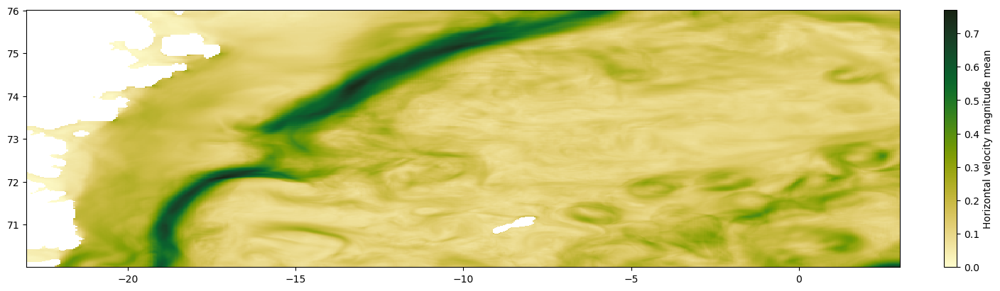

In [7]:
mean_hor_vel = hor_vel.mean(dim='time')
fig, ax1 = plt.subplots(1,1,figsize=(14,4),layout='constrained')
mesh = ax1.pcolormesh(hor_vel.X,hor_vel.Y,mean_hor_vel,vmin=0,cmap=cmo.speed)
cbar = fig.colorbar(mesh)
cbar.set_label('Horizontal velocity magnitude mean')
# # cntr = ax1.contour(eddies.X,eddies.Y,eddies[5],colors='grey')

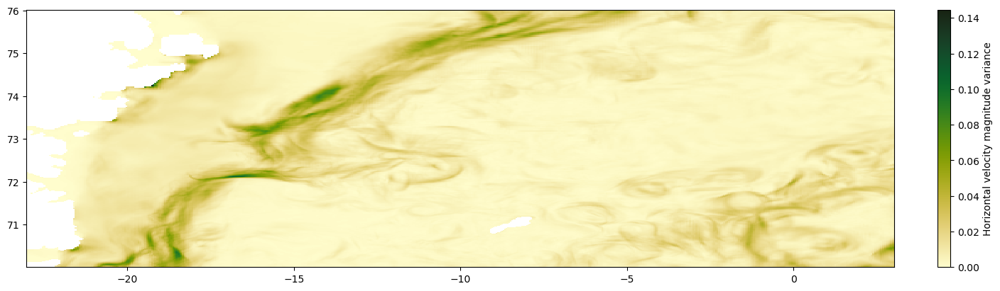

In [8]:
var_hor_vel = hor_vel.var(dim='time')
fig, ax1 = plt.subplots(1,1,figsize=(14,4),layout='constrained')
mesh = ax1.pcolormesh(hor_vel.X,hor_vel.Y,var_hor_vel,vmin=0,cmap=cmo.speed)
cbar = fig.colorbar(mesh)
cbar.set_label('Horizontal velocity magnitude variance')
# cntr = ax1.contour(eddies.X,eddies.Y,eddies[5],colors='grey')

Generating Frames: 63it [00:15,  3.95it/s]                        


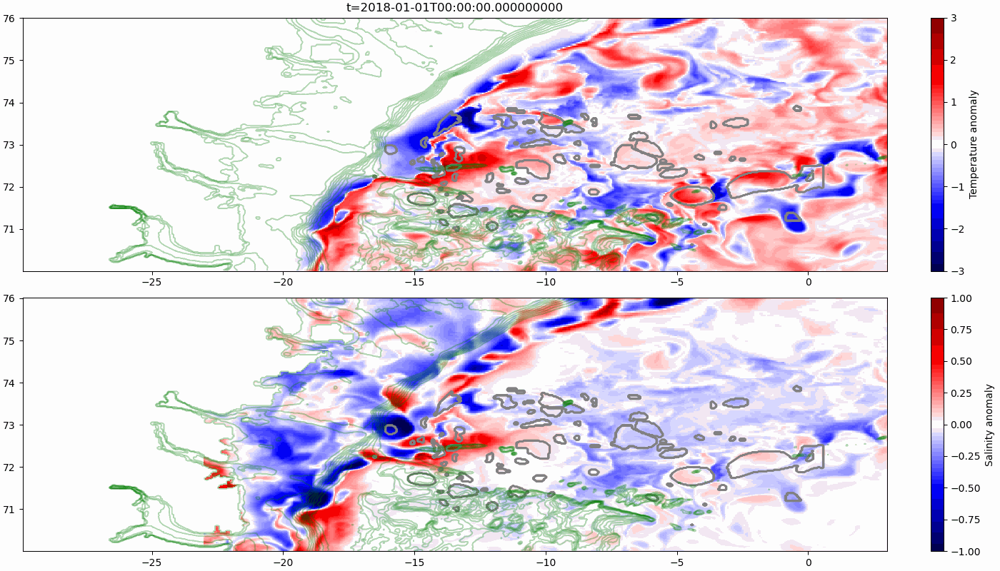

In [9]:
import sys
sys.path.insert(1,r'C:\Users\eirik\Master')
from animation import animate_eddies_prop
animate_eddies_prop(prop1=T_anom,
                    p1vmin=-3,
                    p1vmax=3,
                    prop2=S_anom,
                    p2vmin=-1,
                    p2vmax=1,
                    eddies=eddies1,
                    p1cbarName='Temperature anomaly',
                    p2cbarName='Salinity anomaly',
                    fname='S_T_eddy_SSH',
                    depthcntr=depth)

Generating Frames: 63it [00:16,  3.89it/s]                        


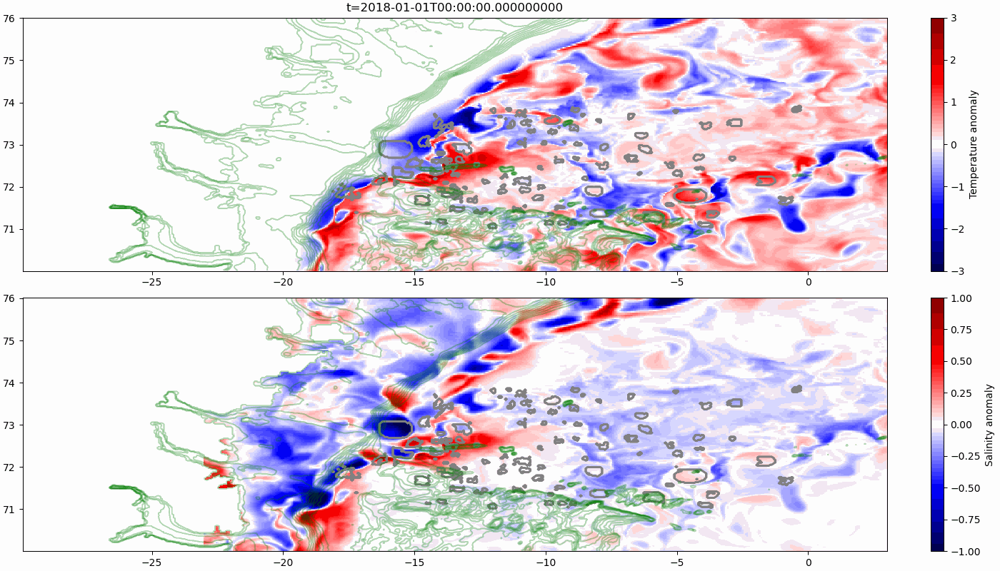

In [10]:
animate_eddies_prop(prop1=T_anom,
                    p1vmin=-3,
                    p1vmax=3,
                    prop2=S_anom,
                    p2vmin=-1,
                    p2vmax=1,
                    eddies=eddies2,
                    p1cbarName='Temperature anomaly',
                    p2cbarName='Salinity anomaly',
                    fname='S_T_eddy_OW',
                    depthcntr=depth)